### Installing Detectron2

### Importing Libraries

In [1]:
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2 import model_zoo
from detectron2.data.datasets import register_coco_instances
from detectron2.modeling import build_model
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
setup_logger()

import random
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


### Registering the dataset

In [2]:
register_coco_instances("my_dataset_train", {}, r"train\coco_dataset_train_margin.json", r"train")
register_coco_instances("my_dataset_val", {}, r"val\coco_dataset_val_margin.json", r"val")
register_coco_instances("my_dataset_test", {}, r"test\coco_dataset_test_margin.json", r"test")

### Visualisation of Data

[09/18 18:15:19 d2.data.datasets.coco]: Loaded 1280 images in COCO format from train\coco_dataset_train_margin.json


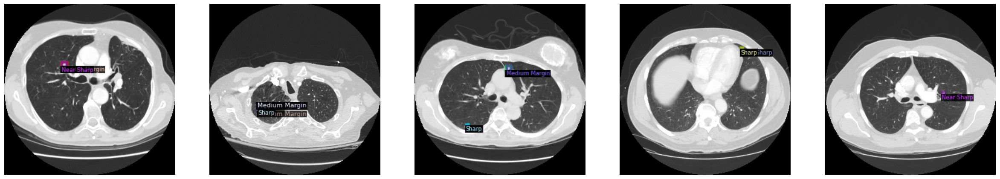

In [3]:

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

fig, axs = plt.subplots(1, 5, figsize=(30, 10))

for ax, d in zip(axs, random.sample(dataset_dicts, 5)):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    img_rgb = vis.get_image()[:, :, ::-1]

    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

### Model Loading, setting up configurations and Training

In [4]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 10
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5

cfg.OUTPUT_DIR = "./MarginOutput"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

model = build_model(cfg)
for param in model.backbone.parameters():
    param.requires_grad = False

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.model.to("cuda")
trainer.train()

[09/18 18:15:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (6, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (6,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (20, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (20,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[09/18 18:15:29 d2.engine.train_loop]: Starting training from iteration 0


c:\Python\Python311\Lib\site-packages\torch\functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3588.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/18 18:18:50 d2.utils.events]:  eta: 0:00:00  iter: 9  total_loss: 1.246  loss_cls: 0.8663  loss_box_reg: 0.0455  loss_rpn_cls: 0.2315  loss_rpn_loc: 0.07176    time: 18.3698  last_time: 18.6014  data_time: 1.6519  last_data_time: 0.0077   lr: 0.0022503  max_mem: 2618M
[09/18 18:19:06 d2.engine.hooks]: Overall training speed: 8 iterations in 0:02:26 (18.3698 s / it)
[09/18 18:19:06 d2.engine.hooks]: Total training time: 0:02:46 (0:00:19 on hooks)


In [5]:
%load_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 4364), started 1:51:47 ago. (Use '!kill 4364' to kill it.)

### Inference and Evaluaton

In [6]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[09/18 18:19:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./MarginOutput\model_final.pth ...


[09/18 18:19:18 d2.data.datasets.coco]: Loaded 211 images in COCO format from test\coco_dataset_test_margin.json


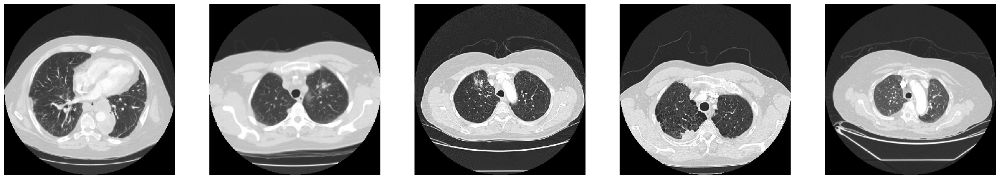

In [7]:
dataset_dicts = DatasetCatalog.get("my_dataset_test")

fig, axs = plt.subplots(1, 5, figsize=(30, 10))

for ax, d in zip(axs, random.sample(dataset_dicts, 5)):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_train_metadata,
                   scale=0.6
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_rgb = v.get_image()[:, :, ::-1]

    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

Evaluating on Validation Dataset

In [8]:
val_evaluator = COCOEvaluator("my_dataset_val", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, val_evaluator))

[09/18 18:19:57 d2.data.datasets.coco]: Loaded 197 images in COCO format from val\coco_dataset_val_margin.json


[09/18 18:19:57 d2.data.build]: Distribution of instances among all 5 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| Poorly Defi.. | 29           | Near Poorly.. | 45           | Medium Margin | 90           |
|  Near Sharp   | 156          |     Sharp     | 220          |               |              |
|     total     | 540          |               |              |               |              |
[09/18 18:19:57 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/18 18:19:57 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/18 18:19:57 d2.data.common]: Serializing 197 elements to byte tensors and concatenating them all ...
[09/18 18:19:57 d2.data.common]: Serializ

KeyboardInterrupt: 

Evaluating on Test Dataset

In [ ]:
test_evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, test_loader, test_evaluator))

[09/18 16:35:08 d2.data.datasets.coco]: Loaded 211 images in COCO format from test\coco_dataset_test_sphericity.json
[09/18 16:35:08 d2.data.build]: Distribution of instances among all 5 categories:
|  category   | #instances   |   category   | #instances   |  category  | #instances   |
|:-----------:|:-------------|:------------:|:-------------|:----------:|:-------------|
|   Linear    | 0            | Ovoid/Linear | 42           |   Ovoid    | 194          |
| Ovoid/Round | 191          |      NA      | 188          |            |              |
|    total    | 615          |              |              |            |              |
[09/18 16:35:08 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/18 16:35:08 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/18 16:35:08 d2.data.common]: Serializing 211 elements t